#Introduction



---



In [137]:
#magic function for matplotlib graphs. Graphs will be included in notebook next to the code. 
%matplotlib inline

In [138]:
#importing dependencies
from __future__ import print_function, division

from datetime import datetime
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as T
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
import time
import os
import copy

plt.ion()   # interactive mode

In [139]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Load Data
---------


In [140]:
#Dataset from drive 
DATA_FILE = "/content/drive/MyDrive/MLProjects/dataset/APD"
train_dataset = "/content/drive/MyDrive/Datasets/dataset/APD/Train/"
val_dataset = "/content/drive/MyDrive/Datasets/dataset/APD/Validation/"

#Data transformation

In [141]:
#changing the format and structure of the data.
data_transforms = {
    'Train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Validation': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = DATA_FILE
data_types = ['Train', 'Validation']
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in data_types}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in data_types}
dataset_sizes = {x: len(image_datasets[x]) for x in data_types}
class_names = image_datasets['Train'].classes

#checking for available processor 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# Data Visualization

With the help of data visualization, we can see how the data looks and what we are dealing with from the image. 



In [142]:
print("List of Directories:", os.listdir(data_dir))
classes = os.listdir(data_dir + "/Train")
print("List of classes:", classes)

List of Directories: ['Train', 'Validation']
List of classes: ['Fatigue cracks', 'Linear cracks', 'Potholes']


In [143]:
image_size = 300
batch_size = 128

In [144]:
train_dataset = ImageFolder(data_dir+'/Train', transform=ToTensor())
val_dataset = ImageFolder(data_dir+'/Validation', transform=ToTensor())

In [145]:
train_dataset = ImageFolder(data_dir + '/Train', transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor()]))

val_dataset = ImageFolder(data_dir + '/Validation', transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor()]))

In [146]:
img, label = val_dataset[2]
print(img.shape, label)
img

torch.Size([3, 300, 300]) 0


tensor([[[0.5647, 0.5686, 0.5294,  ..., 0.6078, 0.6118, 0.5922],
         [0.5373, 0.5451, 0.5020,  ..., 0.5843, 0.5961, 0.5725],
         [0.4941, 0.5059, 0.4667,  ..., 0.5490, 0.5725, 0.5490],
         ...,
         [0.4784, 0.5529, 0.5608,  ..., 0.4706, 0.4902, 0.4784],
         [0.5059, 0.5647, 0.5647,  ..., 0.4941, 0.4196, 0.4392],
         [0.5255, 0.5725, 0.5647,  ..., 0.5059, 0.3725, 0.4118]],

        [[0.5647, 0.5686, 0.5294,  ..., 0.6118, 0.6157, 0.5961],
         [0.5373, 0.5451, 0.5020,  ..., 0.5882, 0.6000, 0.5765],
         [0.4941, 0.5059, 0.4667,  ..., 0.5529, 0.5765, 0.5529],
         ...,
         [0.4745, 0.5490, 0.5569,  ..., 0.4667, 0.4863, 0.4745],
         [0.4980, 0.5569, 0.5569,  ..., 0.4902, 0.4157, 0.4353],
         [0.5176, 0.5647, 0.5569,  ..., 0.5020, 0.3686, 0.4078]],

        [[0.6118, 0.6157, 0.5765,  ..., 0.6314, 0.6353, 0.6157],
         [0.5804, 0.5882, 0.5490,  ..., 0.6078, 0.6196, 0.5961],
         [0.5333, 0.5451, 0.5059,  ..., 0.5725, 0.5961, 0.

In [147]:
import matplotlib.pyplot as plt

def show_example(img, label):
    print('Label: ', train_dataset.classes[label], "("+str(label)+")")
    plt.imshow(img.permute(1, 2, 0))

Label:  Fatigue cracks (0)


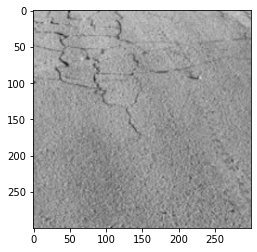

In [148]:
show_example(*train_dataset[56])

Label:  Potholes (2)


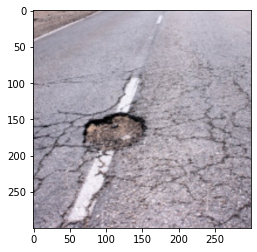

In [149]:
import random
random_value = random.randint(1000, 2000)
show_example(*train_dataset[random_value])

Label:  Linear cracks (1)


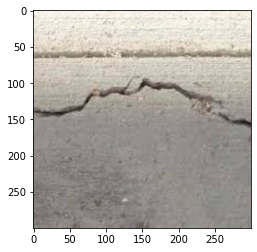

In [150]:
random_value = random.randint(800, 900)
show_example(*train_dataset[random_value])

Label:  Fatigue cracks (0)


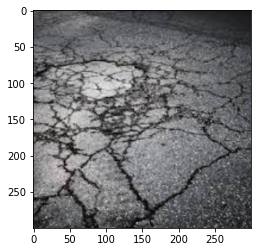

In [151]:
random_value = random.randint(200, 300)
show_example(*train_dataset[random_value])

613
Label:  Fatigue cracks (0)


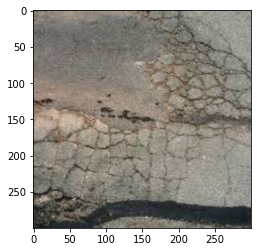

In [152]:
random_value = random.randint(550, 650)
print(random_value)
show_example(*train_dataset[random_value])

In [153]:
new_batch_size = 12
train_dl = DataLoader(train_dataset, new_batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_dl = DataLoader(val_dataset, new_batch_size*2, num_workers=4, pin_memory=True)

In [154]:
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(18, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=4).permute(1, 2, 0))
        break

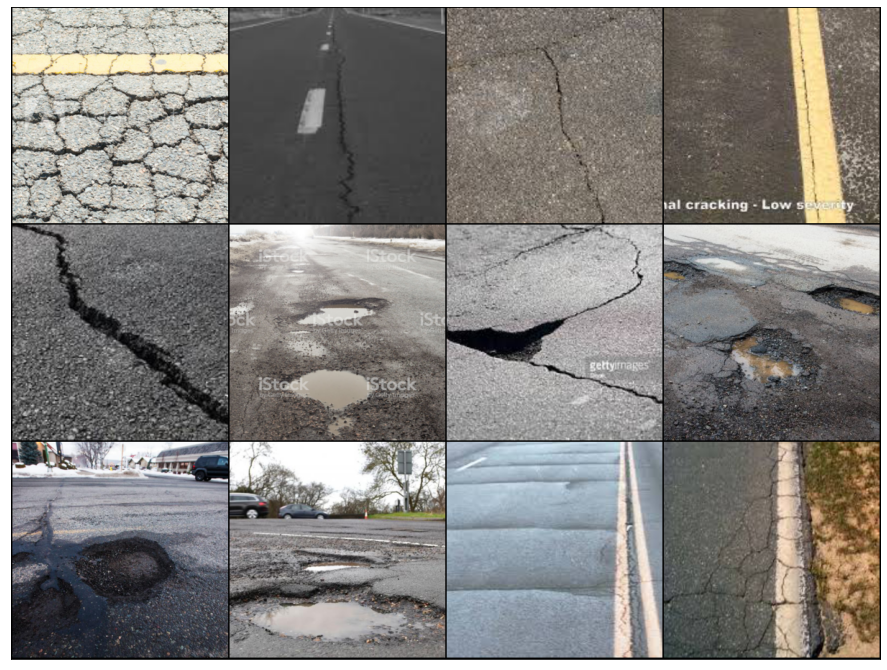

In [155]:
show_batch(train_dl)


#Tensorboarding

In [156]:
#tensorboard logging
#to track various metrics such as accuracy and log loss on training or validation set
from torch.utils.tensorboard import SummaryWriter

TB_DIR = f'runs/exp_{datetime.now().strftime("%Y%m%d-%H%M%S")}'  
tb_train_writer = SummaryWriter(f'{TB_DIR}/Train')
tb_val_writer = SummaryWriter(f'{TB_DIR}/Validation')

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


#Model Building


Helper function for training the model

In [157]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=4):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['Train', 'Validation']:
            if phase == 'Train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'Train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'Train':
              tb_writer = tb_train_writer
            else:
              tb_writer = tb_val_writer

            tb_writer.add_scalar(f'Loss', epoch_loss, epoch)
            tb_writer.add_scalar(f'Accuracy', epoch_acc, epoch)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'Validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    tb_train_writer.close()
    tb_val_writer.close()

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

## Visualizing Predictions



In [158]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [159]:
def visualize_model(model, dataset, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders[dataset]):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

##Finetuning the Convnet
----------------------
Load a pretrained model and reset final fully connected layer.


In [160]:
model_ft = models.resnet101(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to number of classes.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Training and evaluation




In [161]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=24)

Epoch 0/23
----------
Train Loss: 0.6882 Acc: 0.7478
Validation Loss: 0.4862 Acc: 0.8364

Epoch 1/23
----------
Train Loss: 0.5992 Acc: 0.7967
Validation Loss: 0.3840 Acc: 0.8614

Epoch 2/23
----------
Train Loss: 0.4291 Acc: 0.8476
Validation Loss: 0.3487 Acc: 0.8564

Epoch 3/23
----------
Train Loss: 0.3091 Acc: 0.8941
Validation Loss: 0.3449 Acc: 0.8664

Epoch 4/23
----------
Train Loss: 0.2996 Acc: 0.9026
Validation Loss: 0.2761 Acc: 0.8998

Epoch 5/23
----------
Train Loss: 0.2223 Acc: 0.9230
Validation Loss: 0.3524 Acc: 0.8848

Epoch 6/23
----------
Train Loss: 0.1948 Acc: 0.9340
Validation Loss: 0.2821 Acc: 0.9082

Epoch 7/23
----------
Train Loss: 0.1177 Acc: 0.9564
Validation Loss: 0.2976 Acc: 0.8932

Epoch 8/23
----------
Train Loss: 0.1030 Acc: 0.9650
Validation Loss: 0.2860 Acc: 0.9065

Epoch 9/23
----------
Train Loss: 0.0872 Acc: 0.9686
Validation Loss: 0.3115 Acc: 0.9015

Epoch 10/23
----------
Train Loss: 0.0869 Acc: 0.9711
Validation Loss: 0.3043 Acc: 0.8998

Epoch 11/

#Showing TensorBoard for metrices learnt

In [162]:
%tensorboard --logdir='./runs'

Reusing TensorBoard on port 6006 (pid 35718), started 0:34:04 ago. (Use '!kill 35718' to kill it.)

<IPython.core.display.Javascript object>

# Model Testing

In [163]:
def check_accuracy(test_loader, model, device):
    num_correct = 0
    total = 0
    model.eval()

    with torch.no_grad():
        for data, labels in test_loader:
            data = data.to(device=device)
            labels = labels.to(device=device)

            outputs = model(data)
            _, predictions = torch.max(outputs, 1)
            num_correct += (predictions == labels).sum()
            total += labels.size(0)
        print(f"Test Accuracy of the model: {float(num_correct)/float(total):.2f}")

def visualize_test_errors(test_loader, model, device):
    model.eval()
    incorrect_examples=[]

    with torch.no_grad():
        for data, labels in test_loader:
            data = data.to(device=device)
            labels = labels.to(device=device)

            outputs = model(data)
            _, predictions = torch.max(outputs, 1)
            idxs_mask = (predictions != labels).view(-1)
            num_true_idxs = idxs_mask.sum() 
            if num_true_idxs > 0:
                found_falses = data[idxs_mask].cpu().numpy()
                false_predictions = predictions[idxs_mask].cpu().numpy()
                false_labels = labels[idxs_mask].cpu().numpy()
                for j in range(found_falses.shape[0]):
                    incorrect_examples.append((found_falses[j,:,:,:], 
                                               false_predictions[j],
                                               false_labels[j]))
    return incorrect_examples

def show_image(inp, title=None):
    inp = inp.transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) 

def visualize_error_images(error_examples):
    for img, prediction, label in error_examples:
        print(f'gt label: {class_names[label]}')
        print(f'prediction: {class_names[prediction]}')
        show_image(img.squeeze())


Test Accuracy of the model: 0.91
gt label: Linear cracks
prediction: Fatigue cracks


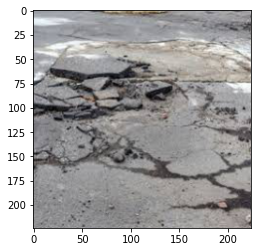

gt label: Fatigue cracks
prediction: Linear cracks


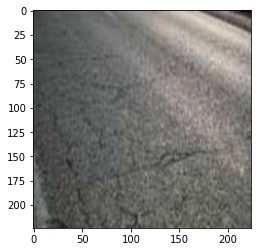

gt label: Linear cracks
prediction: Fatigue cracks


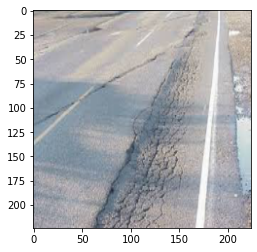

gt label: Linear cracks
prediction: Fatigue cracks


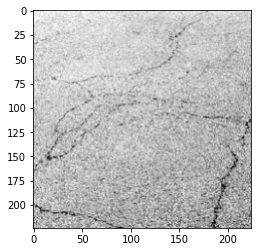

gt label: Potholes
prediction: Fatigue cracks


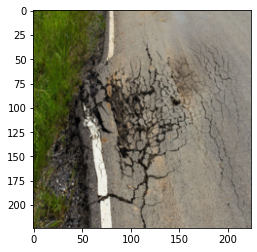

gt label: Fatigue cracks
prediction: Linear cracks


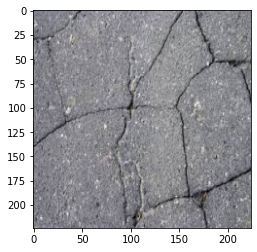

gt label: Linear cracks
prediction: Fatigue cracks


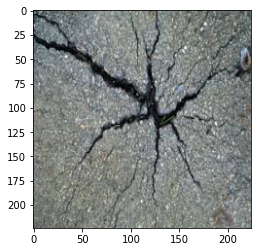

gt label: Potholes
prediction: Linear cracks


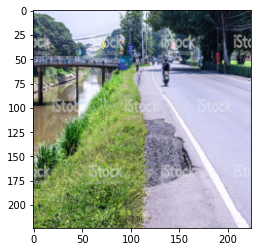

gt label: Linear cracks
prediction: Fatigue cracks


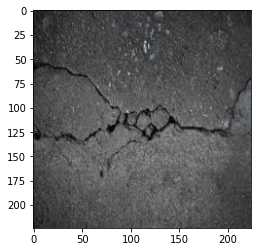

gt label: Linear cracks
prediction: Potholes


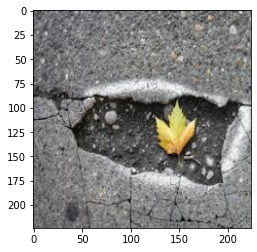

gt label: Linear cracks
prediction: Fatigue cracks


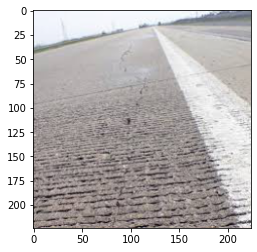

gt label: Linear cracks
prediction: Fatigue cracks


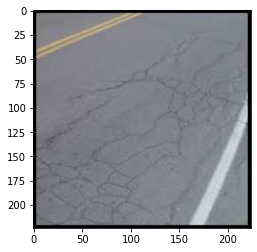

gt label: Linear cracks
prediction: Fatigue cracks


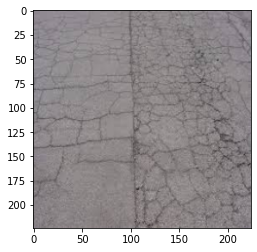

gt label: Linear cracks
prediction: Fatigue cracks


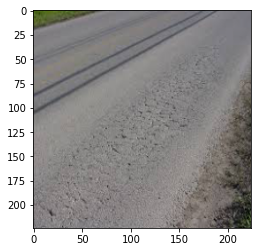

gt label: Potholes
prediction: Fatigue cracks


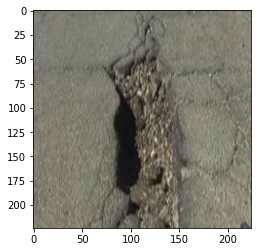

gt label: Linear cracks
prediction: Fatigue cracks


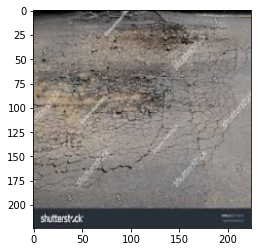

gt label: Linear cracks
prediction: Fatigue cracks


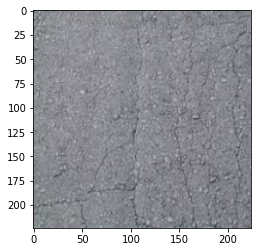

gt label: Fatigue cracks
prediction: Linear cracks


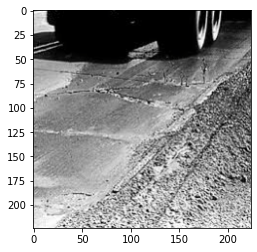

gt label: Linear cracks
prediction: Fatigue cracks


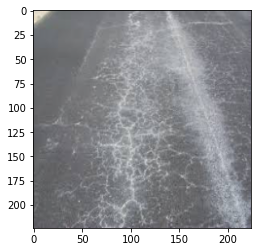

gt label: Fatigue cracks
prediction: Linear cracks


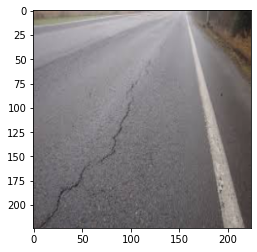

gt label: Fatigue cracks
prediction: Linear cracks


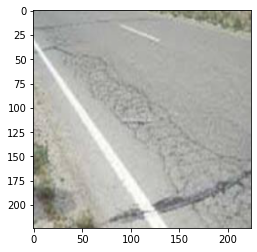

gt label: Fatigue cracks
prediction: Linear cracks


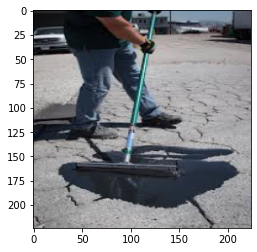

gt label: Fatigue cracks
prediction: Linear cracks


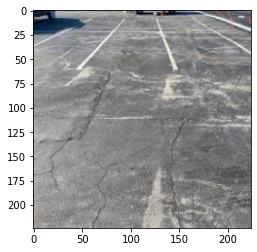

gt label: Linear cracks
prediction: Fatigue cracks


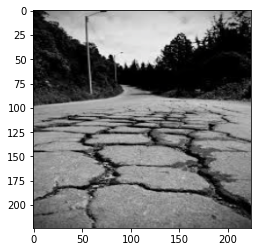

gt label: Linear cracks
prediction: Fatigue cracks


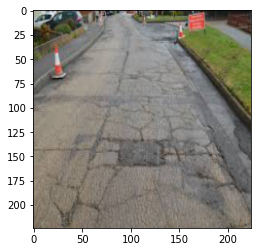

gt label: Linear cracks
prediction: Fatigue cracks


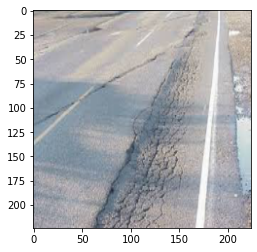

gt label: Fatigue cracks
prediction: Linear cracks


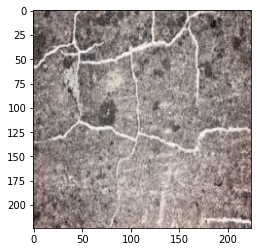

gt label: Fatigue cracks
prediction: Linear cracks


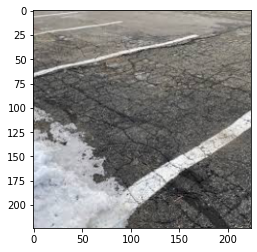

gt label: Fatigue cracks
prediction: Linear cracks


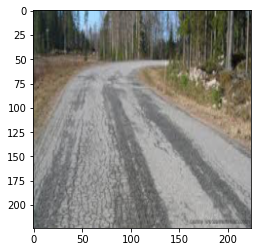

gt label: Fatigue cracks
prediction: Linear cracks


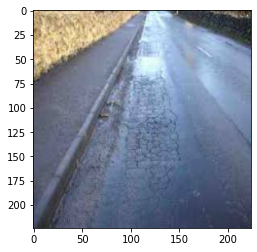

gt label: Linear cracks
prediction: Fatigue cracks


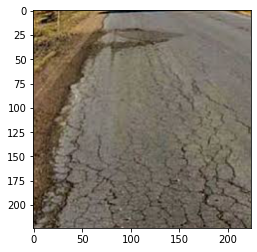

gt label: Fatigue cracks
prediction: Linear cracks


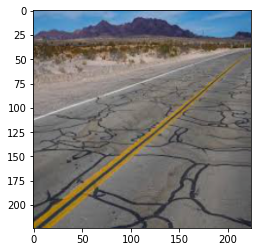

gt label: Linear cracks
prediction: Fatigue cracks


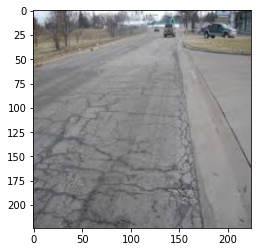

gt label: Fatigue cracks
prediction: Linear cracks


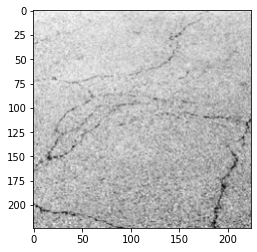

gt label: Potholes
prediction: Fatigue cracks


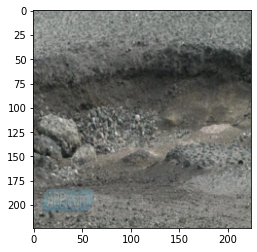

gt label: Linear cracks
prediction: Fatigue cracks


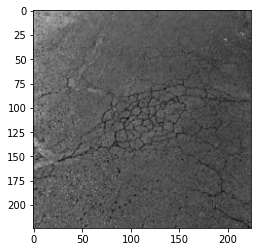

gt label: Fatigue cracks
prediction: Linear cracks


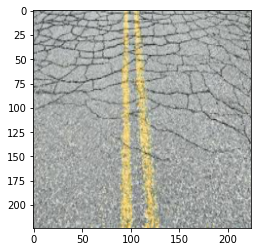

gt label: Fatigue cracks
prediction: Linear cracks


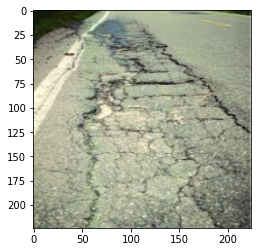

gt label: Linear cracks
prediction: Fatigue cracks


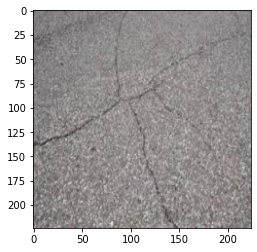

gt label: Linear cracks
prediction: Fatigue cracks


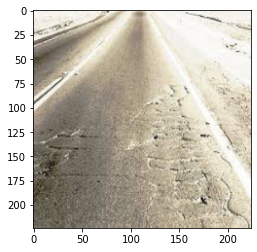

gt label: Linear cracks
prediction: Fatigue cracks


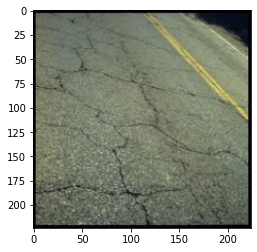

gt label: Fatigue cracks
prediction: Linear cracks


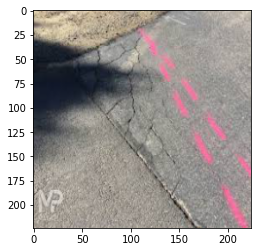

gt label: Fatigue cracks
prediction: Linear cracks


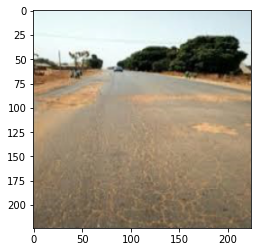

gt label: Linear cracks
prediction: Fatigue cracks


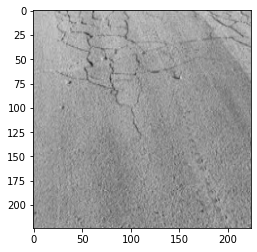

gt label: Fatigue cracks
prediction: Linear cracks


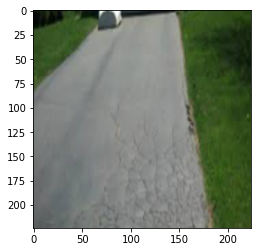

gt label: Linear cracks
prediction: Fatigue cracks


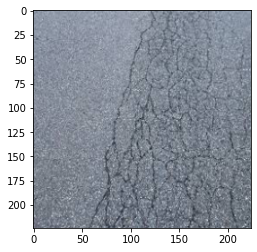

gt label: Linear cracks
prediction: Fatigue cracks


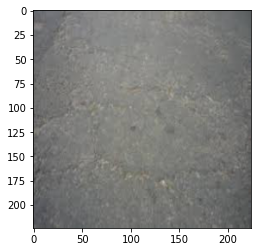

gt label: Fatigue cracks
prediction: Linear cracks


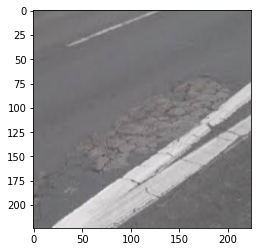

gt label: Fatigue cracks
prediction: Linear cracks


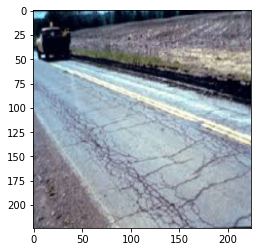

gt label: Linear cracks
prediction: Fatigue cracks


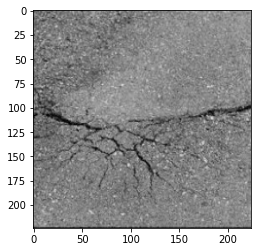

gt label: Linear cracks
prediction: Fatigue cracks


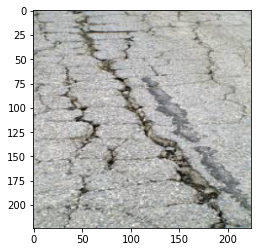

gt label: Fatigue cracks
prediction: Linear cracks


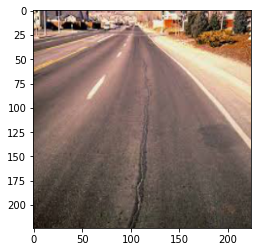

gt label: Fatigue cracks
prediction: Linear cracks


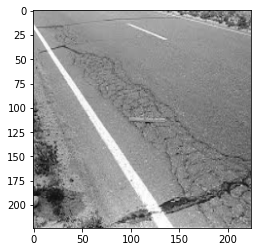

gt label: Fatigue cracks
prediction: Linear cracks


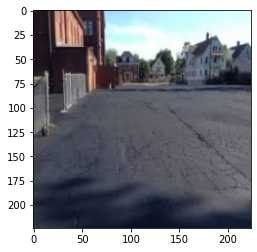

gt label: Fatigue cracks
prediction: Linear cracks


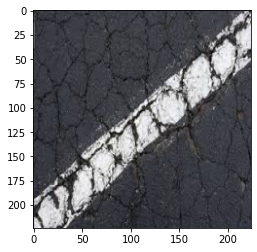

In [164]:
error_images = check_accuracy(dataloaders['Validation'], model_ft, device)

error_examples = visualize_test_errors(dataloaders['Validation'], model_ft, device)
#shows some prediction errors. Might show nothing if prediction is 100%
visualize_error_images(error_examples)

# Model Saving

In [166]:
torch.save(model_ft, 'model-APD-pytorch-res101-91accuracy.pt')